In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/refcoco.pth
/kaggle/input/reference.txt
/kaggle/input/dinov2_vitl14_pretrain.pth
/kaggle/input/sam_vit_h_4b8939.pth
/kaggle/input/sample_image.jpg
/kaggle/input/swint_only_sam_many2many.pth
/kaggle/input/Images-20250418T060633Z-001/Images/backpack_dog/01.jpg
/kaggle/input/Images-20250418T060633Z-001/Images/backpack_dog/00.jpg
/kaggle/input/Images-20250418T060633Z-001/Images/clock/01.jpg
/kaggle/input/Images-20250418T060633Z-001/Images/clock/00.jpg
/kaggle/input/Images-20250418T060633Z-001/Images/can/01.jpg
/kaggle/input/Images-20250418T060633Z-001/Images/can/00.jpg
/kaggle/input/Images-20250418T060633Z-001/Images/berry_bowl/01.jpg
/kaggle/input/Images-20250418T060633Z-001/Images/berry_bowl/00.jpg
/kaggle/input/Images-20250418T060633Z-001/Images/candle/01.jpg
/kaggle/input/Images-20250418T060633Z-001/Images/candle/00.jpg
/kaggle/input/Images-20250418T060633Z-001/Images/barn/01.jpg
/kaggle/input/Images-20250418T060633Z-001/Images/barn/00.jpg
/kaggle/input/Images-20250418T06

In [2]:
!pip install ftfy packaging regex tqdm torch torchvision huggingface_hub safetensors timm open_clip_torch fairscale==0.4.4 pycocoevalcap #requests filelock mmcv-full==1.3.12 mmsegmentation pycocotools==2.0.2 opencv-python==4.5.3.56

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 235.4/235.4 kB 5.8 MB/s eta 0:00:00ta 0:00:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.5 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 7.9 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 30.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 11.5 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 2.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 59.4 MB/s eta 0:00:00:00:010:01
   ━━━━━━━━━━━━

In [3]:
!pip install open_clip_torch

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from transformers import CLIPProcessor, CLIPModel, BlipProcessor, BlipForQuestionAnswering, BlipForConditionalGeneration
import torch
from PIL import Image
import requests
from open_clip import create_model_from_pretrained, get_tokenizer
import torch.nn.functional as F

2025-04-20 15:04:30.188053: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1745161470.425587      31 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1745161470.493804      31 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [5]:
clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

config.json:   0%|          | 0.00/4.19k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/862k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

In [6]:
clips_model, clips_processor = create_model_from_pretrained('hf-hub:UCSC-VLAA/ViT-L-14-CLIPS-224-Recap-DataComp-1B')
clips_tokenizer = get_tokenizer('hf-hub:UCSC-VLAA/ViT-L-14-CLIPS-Recap-DataComp-1B')

open_clip_pytorch_model.bin:   0%|          | 0.00/1.66G [00:00<?, ?B/s]

open_clip_config.json:   0%|          | 0.00/943 [00:00<?, ?B/s]

open_clip_config.json:   0%|          | 0.00/943 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

# 3. BLIP vs CLIP

In [7]:
image_dir = "/kaggle/input/samples-20250417T083449Z-001/samples/"
device = "cuda" if torch.cuda.is_available() else "cpu"

In [8]:
blipc_model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base").to(device)
blipc_processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")

config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/990M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/990M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/287 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/506 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

In [9]:
all_captions = {}

for filename in os.listdir(image_dir):
    image_path = os.path.join(image_dir, filename)
    cur_image = Image.open(image_path).convert("RGB")

    cur_inputs = blipc_processor(images=cur_image, return_tensors="pt").to(device)
    with torch.no_grad():
        cur_output = blipc_model.generate(**cur_inputs)

    cur_caption = blipc_processor.decode(cur_output[0], skip_special_tokens=True)
    all_captions[image_path] = cur_caption

Caption: a small dog running across a green field


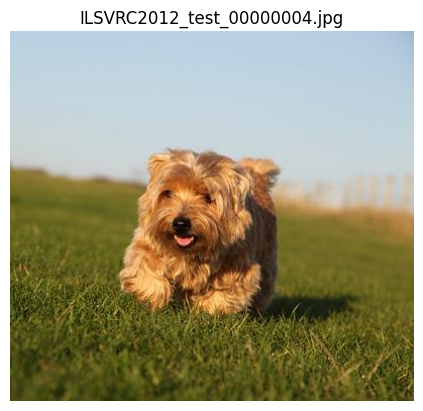


Caption: a small dog standing on a stone ledge


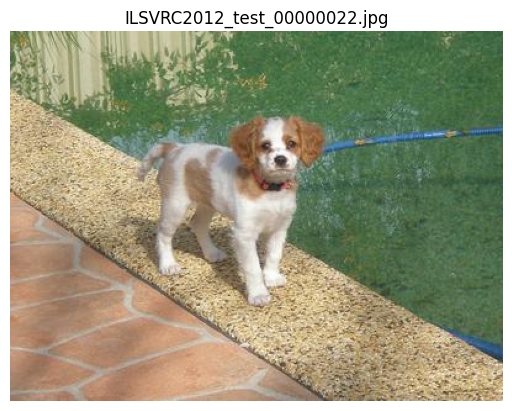


Caption: a man riding a bike down a wet street


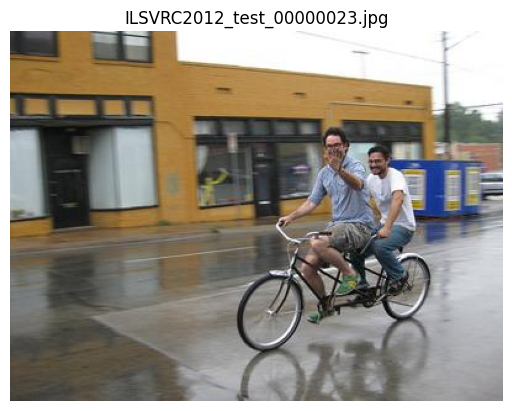


Caption: a man in a suit and tie sitting on a couch


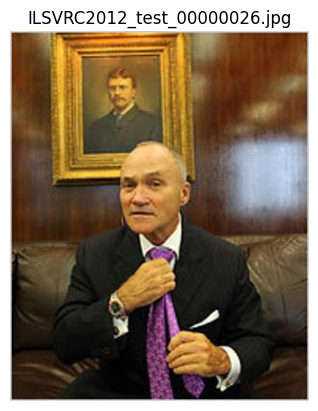


Caption: a family sitting in a pool with a towel


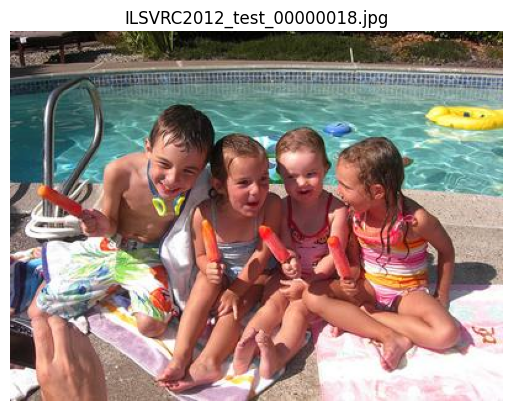


Caption: a small dog walking on a green carpet


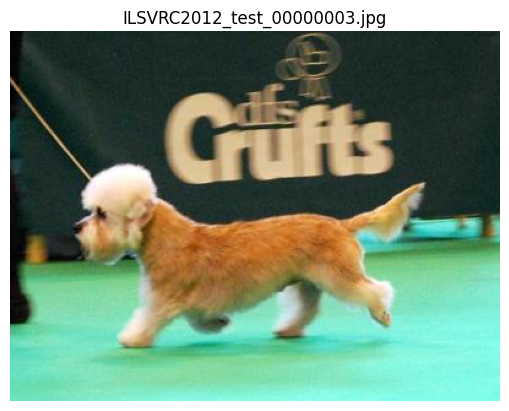


Caption: a small bird sitting on a plant


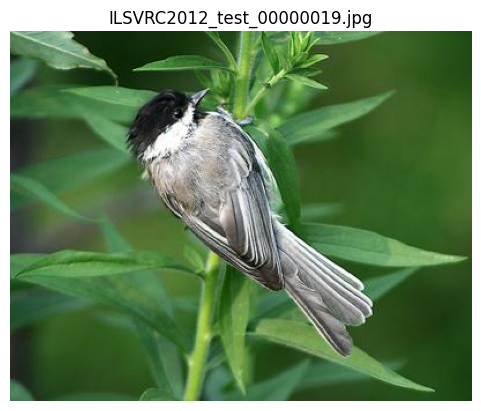


Caption: a duck drinking water from a pond


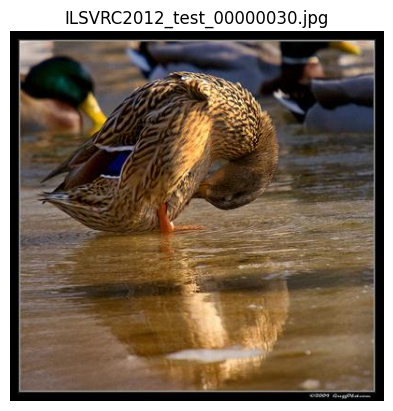


Caption: a coffee machine with two cups on it


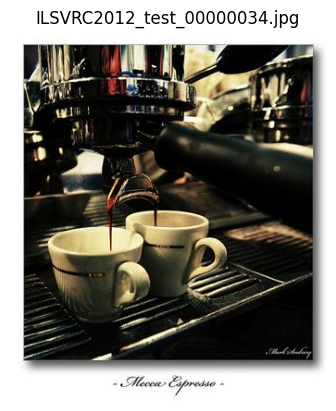


Caption: a brown butterfly sitting on a green plant


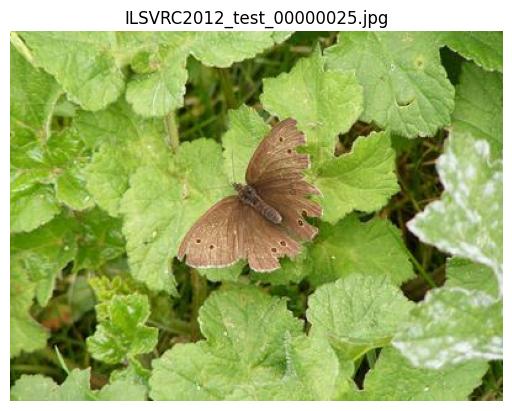

In [10]:
for image_path in all_captions.keys():
    print("Caption:", all_captions[image_path])
    plt.imshow(Image.open(image_path))
    plt.axis("off")
    plt.title(image_path.split("/")[-1])
    plt.show()

    print()

In [11]:
clip_eval = {}

for image_path in all_captions.keys():
    cur_image = Image.open(image_path)
    cur_input = clip_processor(text=all_captions[image_path] , images=cur_image, return_tensors="pt", padding=True)

    outputs = clip_model(**cur_input)
    logits_per_image = outputs.logits_per_image
    
    clip_eval[image_path] = logits_per_image[0][0].item()

Caption: a small dog running across a green field
CLIP Eval Score: 32.70260238647461


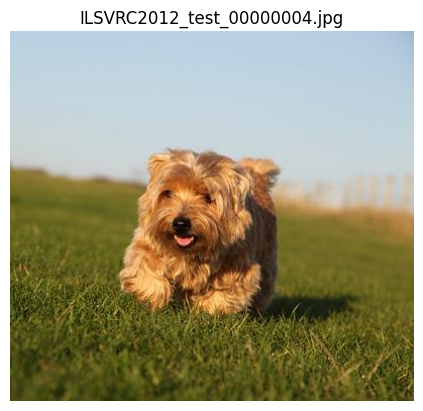


Caption: a small dog standing on a stone ledge
CLIP Eval Score: 31.03472137451172


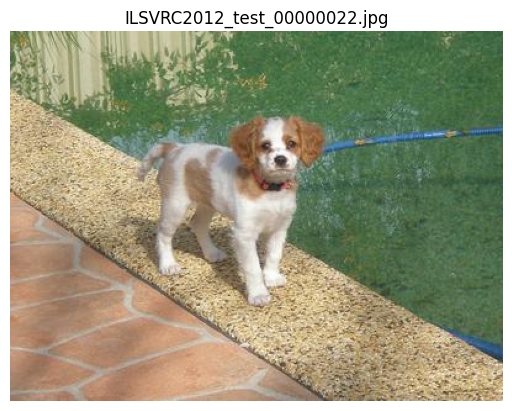


Caption: a man riding a bike down a wet street
CLIP Eval Score: 30.83452606201172


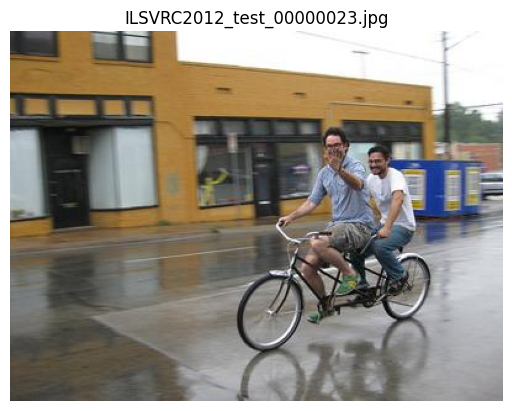


Caption: a man in a suit and tie sitting on a couch
CLIP Eval Score: 28.895353317260742


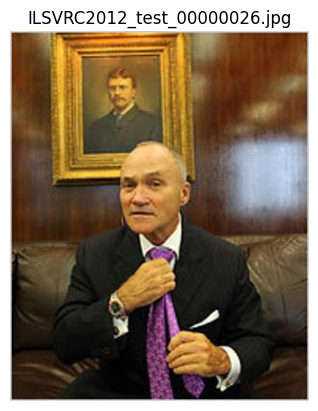


Caption: a family sitting in a pool with a towel
CLIP Eval Score: 31.336458206176758


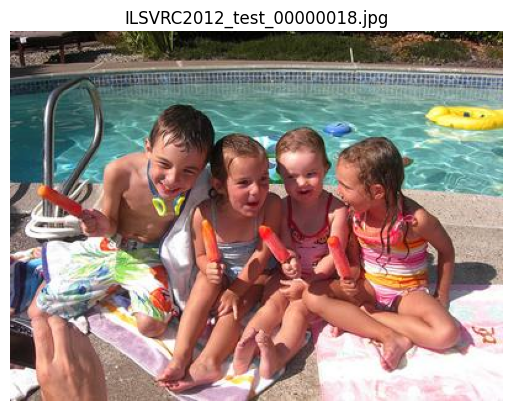


Caption: a small dog walking on a green carpet
CLIP Eval Score: 31.566001892089844


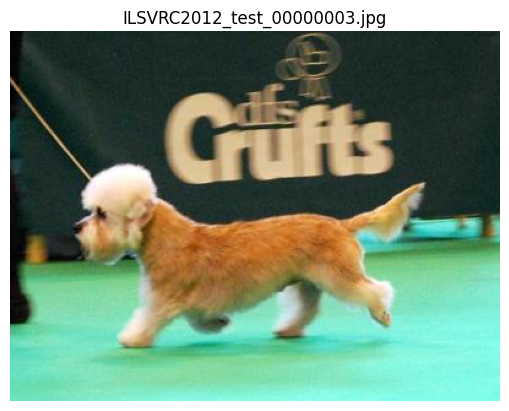


Caption: a small bird sitting on a plant
CLIP Eval Score: 28.93827247619629


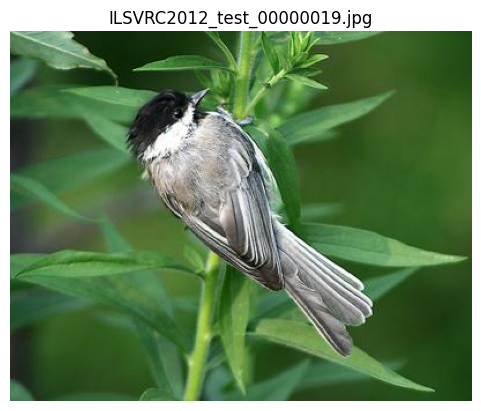


Caption: a duck drinking water from a pond
CLIP Eval Score: 30.52522087097168


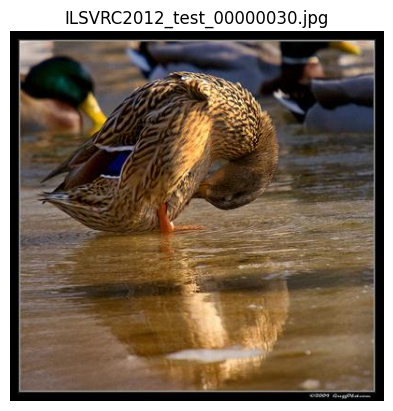


Caption: a coffee machine with two cups on it
CLIP Eval Score: 27.961320877075195


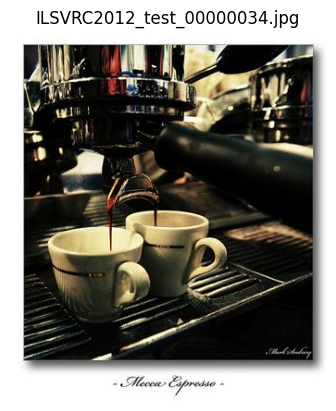


Caption: a brown butterfly sitting on a green plant
CLIP Eval Score: 28.91630744934082


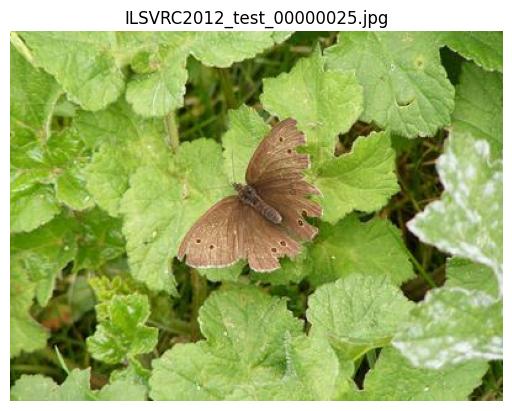

In [12]:
for image_path in all_captions.keys():
    print("Caption:", all_captions[image_path])
    print("CLIP Eval Score:", clip_eval[image_path])
    plt.imshow(Image.open(image_path))
    plt.axis("off")
    plt.title(image_path.split("/")[-1])
    plt.show()

    print()

In [13]:
clips_eval = {}

for image_path in all_captions.keys():
    cur_image = Image.open(image_path)
    cur_input = clips_processor(cur_image).unsqueeze(0)
    text_tokens = clips_tokenizer([all_captions[image_path]], context_length=clips_model.context_length)

    with torch.no_grad():
        image_features = clips_model.encode_image(cur_input)
        text_features = clips_model.encode_text(text_tokens)

    image_features = F.normalize(image_features, dim=-1)
    text_features = F.normalize(text_features, dim=-1)

    text_probs = (100 * image_features @ text_features.T)

    clips_eval[image_path] = text_probs[0][0].item()

Caption: a small dog running across a green field
CLIPS Eval Score: 19.154850006103516


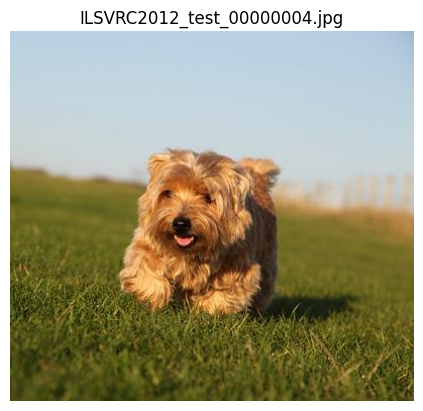


Caption: a small dog standing on a stone ledge
CLIPS Eval Score: 15.125470161437988


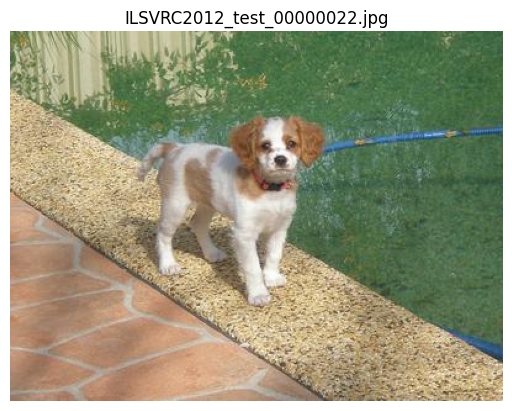


Caption: a man riding a bike down a wet street
CLIPS Eval Score: 16.9235782623291


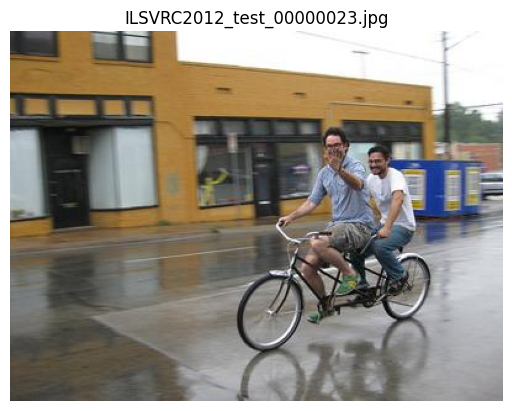


Caption: a man in a suit and tie sitting on a couch
CLIPS Eval Score: 12.757262229919434


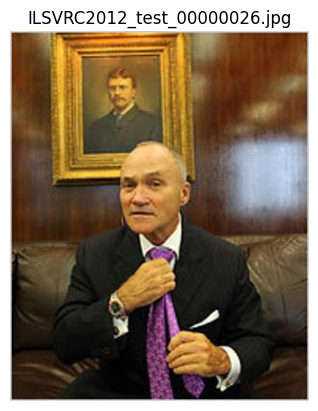


Caption: a family sitting in a pool with a towel
CLIPS Eval Score: 14.84744644165039


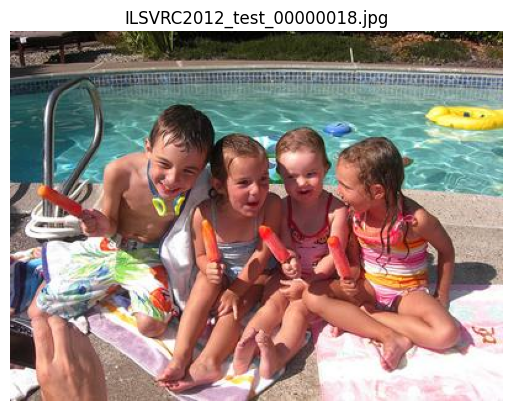


Caption: a small dog walking on a green carpet
CLIPS Eval Score: 18.1807804107666


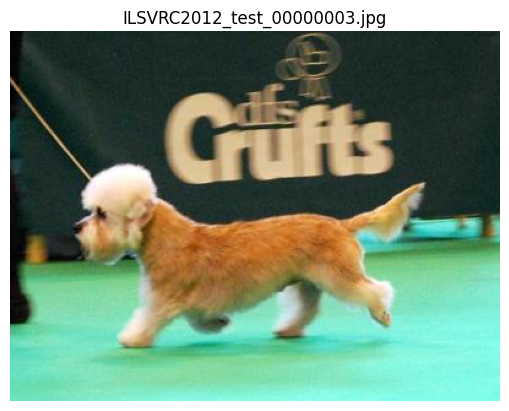


Caption: a small bird sitting on a plant
CLIPS Eval Score: 16.976831436157227


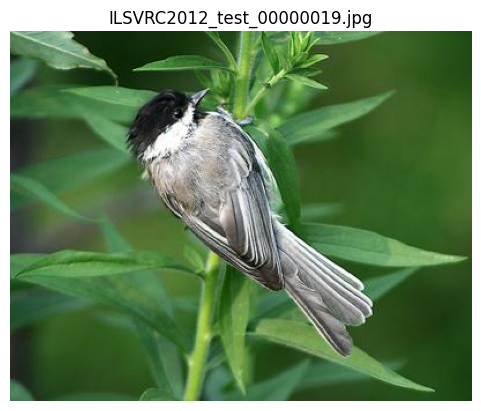


Caption: a duck drinking water from a pond
CLIPS Eval Score: 16.51715850830078


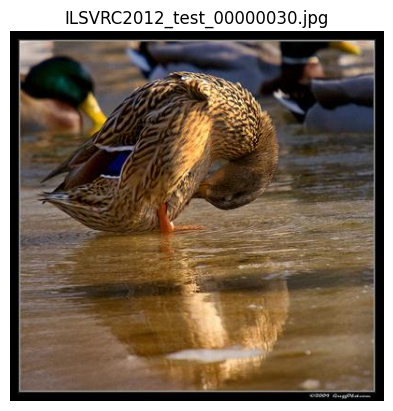


Caption: a coffee machine with two cups on it
CLIPS Eval Score: 15.60645866394043


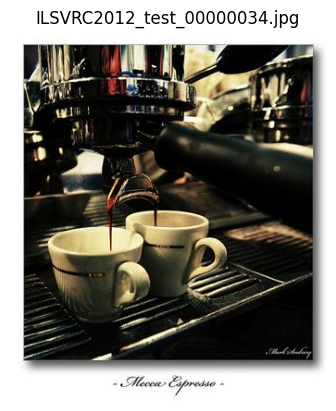


Caption: a brown butterfly sitting on a green plant
CLIPS Eval Score: 16.74422836303711


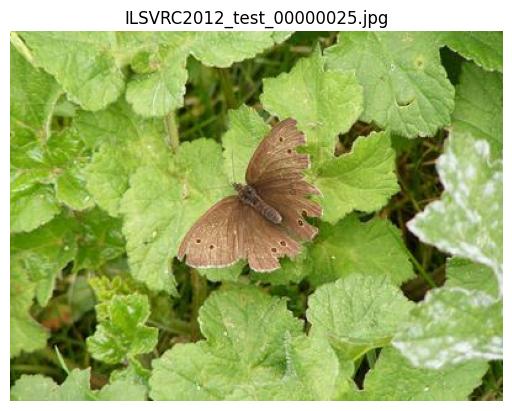

In [14]:
for image_path in all_captions.keys():
    print("Caption:", all_captions[image_path])
    print("CLIPS Eval Score:", clips_eval[image_path])
    plt.imshow(Image.open(image_path))
    plt.axis("off")
    plt.title(image_path.split("/")[-1])
    plt.show()

    print()